In [5]:
import librosa
import librosa.display
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
import math
from scipy.io.wavfile import write

In [6]:
filename = r"voc.mp3"
y, sr = librosa.load(filename,44100)
y=y[int(20*sr):int(20.5*sr)]
# y=np.concatenate([y,y,y,y,y,y,y])
whale_song, _ = librosa.effects.trim(y)

D:\Ext. App Files\Code\Py\DataScience\Venv_Conda\Lib\site-packages\librosa\core\audio.py:165: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn("PySoundFile failed. Trying audioread instead.")


In [7]:
t = np.linspace(0, 1, int(sr * 2))
ff = np.array(range(5))
ff=512+ff*1024
all_freq=np.array([])
all_ratio=np.array([])
for i, bf in enumerate(ff):
      rf=bf+np.array(range(-128//(i+1), 128//(i+1)))
      f_r=(1-(2*np.array(range(len(rf)))/len(rf)-1)**2)/5**i

      all_freq = np.concatenate([all_freq,rf])
      all_ratio = np.concatenate([all_ratio,f_r])

whale_song=0*t
for freq,ratio in zip(all_freq,all_ratio):
      whale_song+=ratio*np.cos(2*np.pi*freq*t)

In [8]:
note_freqs = np.linspace(0, 11*12-1, 11*12)/12
note_freqs = 16.35*pow(2,note_freqs)

amplitude = 2048; duration=1; freq=800
t = np.linspace(0, duration, int(sr * duration))
whale_song = amplitude * np.sin(2 * np.pi * freq * t)

# note_freqs = 2595*np.log10(1 + note_freqs/700)
fig = px.line(whale_song)
fig.show()

In [9]:
t = np.linspace(0, duration, int(sr * duration))
whale_song = amplitude * np.arccos(np.cos(np.pi*2*t*2**10))

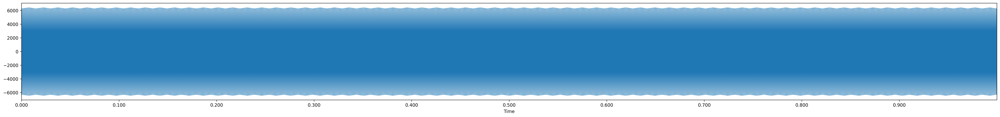

In [10]:
write('twinkle-twinkle.wav', sr,
      (whale_song * (16300 / np.max(whale_song))).astype(np.int16))
plt.figure(figsize=(39, 4), dpi=300)
librosa.display.waveplot(whale_song, sr=sr)
plt.show()
fig = px.line(whale_song)
fig.show()

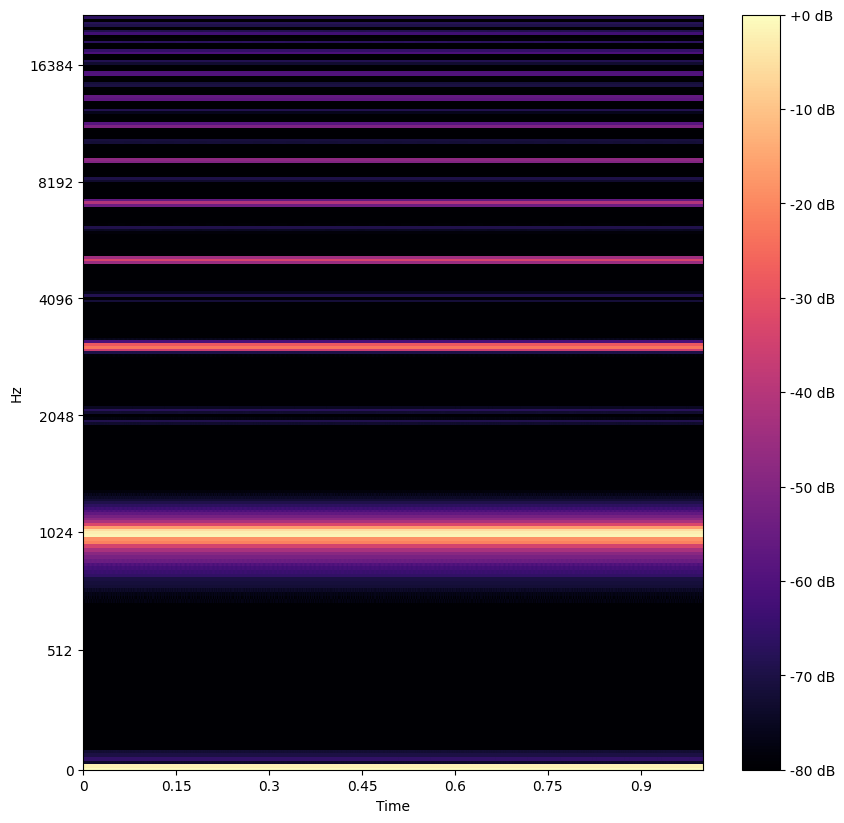

D:\Ext. App Files\Code\Py\DataScience\Venv_Conda\Lib\site-packages\plotly\graph_objs\_deprecations.py:378: DeprecationWarning:

plotly.graph_objs.Line is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.Line
  - plotly.graph_objs.layout.shape.Line
  - etc.




In [11]:
# plt.figure(figsize=(10, 10), dpi=300)
n_fft = 2048
hop_length = 64
n_mels = 256
plt.figure(figsize=(10, 10), dpi=100)
mel = librosa.filters.mel(sr=sr, n_fft=n_fft, n_mels=n_mels)
S = librosa.feature.melspectrogram(whale_song, sr=sr,
            n_fft=n_fft, hop_length=hop_length, n_mels=n_mels)
S_DB = librosa.power_to_db(S, ref=np.max)
librosa.display.specshow(S_DB, sr=sr, hop_length=hop_length,
                         x_axis='time', y_axis='mel');
plt.colorbar(format='%+2.0f dB');
plt.show()

fig = go.Figure(data=go.Heatmap(z=S_DB))
fig.show()
# fig = go.Figure(data=go.Heatmap(z=mel))
# fig.show()

fig = go.Figure(data=go.Line(x=np.arange(0,2**14),
                y=2595*np.log10(1+np.arange(0,2**14)/700)))
fig.show()

# 1892/2047

In [12]:
# y=0
# y = librosa.griffinlim(librosa.feature.inverse.mel_to_stft(S))
# write('twinkle-twinkle.wav', sr*3,
#       (y * (16300 / np.max(whale_song))).astype(np.int16))

# fig = px.line(y)
# fig.show()